## 1. Business Understanding

#### Introduction
Zencom is a leading telecommunication company providing various services such as mobile, internet, and landline connections to its customers. Lately, the company has been experiencing a significant increase in customer churn rate, where customers are discontinuing their services and switching to competitors. ABC Telecom wants to understand the factors contributing to this churn and develop strategies to reduce it.


#### Problem Statement:
Zencom wants to analyze the churn rate among its customers over a period of time to identify the key factors that influence churn behavior. The company aims to develop actionable insights to reduce churn and improve customer retention.

#### Key Objectives:

Analyze historical churn data to identify trends and patterns.

Identify demographic or behavioral factors associated with higher churn rates.

Build predictive models to forecast future churn and prioritize at-risk customers.

#### Expected Outcomes:

Understanding the churn dynamics and key drivers with Zencom customers.

Create a predictive model capable of forecasting the churn rate and identifying high risk customer segments.

Retention strategies leading to reduced churn rate and enhansed customer sastifactionmes.

## 2. Data Understanding

#### Getting the Data

In [1]:
# Importing Relevant libraries to load and explore the data
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings
warnings.filterwarnings('ignore');


#Reading the data
df=pd.read_csv("C:/Users/bmaruru/Documents/Flatiron/Phase_3/Project/Customer.csv")
# Viewing the first five records
df.head()

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,...,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,...,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,...,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,...,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.90,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


In [2]:
#Viewing the last 5 records
df.tail()

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,...,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
3328,AZ,192,415,414-4276,no,yes,36,156.2,77,26.55,...,126,18.32,279.1,83,12.56,9.9,6,2.67,2,False
3329,WV,68,415,370-3271,no,no,0,231.1,57,39.29,...,55,13.04,191.3,123,8.61,9.6,4,2.59,3,False
3330,RI,28,510,328-8230,no,no,0,180.8,109,30.74,...,58,24.55,191.9,91,8.64,14.1,6,3.81,2,False
3331,CT,184,510,364-6381,yes,no,0,213.8,105,36.35,...,84,13.57,139.2,137,6.26,5.0,10,1.35,2,False
3332,TN,74,415,400-4344,no,yes,25,234.4,113,39.85,...,82,22.60,241.4,77,10.86,13.7,4,3.70,0,False


#### Data Description

In [3]:
# Viewing the shape of the data
df.shape

(3333, 21)

The dataset has 3,333 rows and 21 columns 

In [4]:
# Viewing the columns of the dataset
df.columns

Index(['state', 'account length', 'area code', 'phone number',
       'international plan', 'voice mail plan', 'number vmail messages',
       'total day minutes', 'total day calls', 'total day charge',
       'total eve minutes', 'total eve calls', 'total eve charge',
       'total night minutes', 'total night calls', 'total night charge',
       'total intl minutes', 'total intl calls', 'total intl charge',
       'customer service calls', 'churn'],
      dtype='object')

In [5]:
# Capitalize thwe columns and replace the space with an underscore
df.columns= [i.capitalize().replace(' ','_').strip() for i in df.columns]
df.columns

Index(['State', 'Account_length', 'Area_code', 'Phone_number',
       'International_plan', 'Voice_mail_plan', 'Number_vmail_messages',
       'Total_day_minutes', 'Total_day_calls', 'Total_day_charge',
       'Total_eve_minutes', 'Total_eve_calls', 'Total_eve_charge',
       'Total_night_minutes', 'Total_night_calls', 'Total_night_charge',
       'Total_intl_minutes', 'Total_intl_calls', 'Total_intl_charge',
       'Customer_service_calls', 'Churn'],
      dtype='object')

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 21 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   State                   3333 non-null   object 
 1   Account_length          3333 non-null   int64  
 2   Area_code               3333 non-null   int64  
 3   Phone_number            3333 non-null   object 
 4   International_plan      3333 non-null   object 
 5   Voice_mail_plan         3333 non-null   object 
 6   Number_vmail_messages   3333 non-null   int64  
 7   Total_day_minutes       3333 non-null   float64
 8   Total_day_calls         3333 non-null   int64  
 9   Total_day_charge        3333 non-null   float64
 10  Total_eve_minutes       3333 non-null   float64
 11  Total_eve_calls         3333 non-null   int64  
 12  Total_eve_charge        3333 non-null   float64
 13  Total_night_minutes     3333 non-null   float64
 14  Total_night_calls       3333 non-null   

In [7]:
df.describe()

,Account_length,Area_code,Number_vmail_messages,Total_day_minutes,Total_day_calls,Total_day_charge,Total_eve_minutes,Total_eve_calls,Total_eve_charge,Total_night_minutes,Total_night_calls,Total_night_charge,Total_intl_minutes,Total_intl_calls,Total_intl_charge,Customer_service_calls
count,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000
mean,101.064806,437.182418,8.099010,179.775098,100.435644,30.562307,200.980348,100.114311,17.083540,200.872037,100.107711,9.039325,10.237294,4.479448,2.764581,1.562856
std,39.822106,42.371290,13.688365,54.467389,20.069084,9.259435,50.713844,19.922625,4.310668,50.573847,19.568609,2.275873,2.791840,2.461214,0.753773,1.315491
min,1.000000,408.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.200000,33.000000,1.040000,0.000000,0.000000,0.000000,0.000000
25%,74.000000,408.000000,0.000000,143.700000,87.000000,24.430000,166.600000,87.000000,14.160000,167.000000,87.000000,7.520000,8.500000,3.000000,2.300000,1.000000
50%,101.000000,415.000000,0.000000,179.400000,101.000000,30.500000,201.400000,100.000000,17.120000,201.200000,100.000000,9.050000,10.300000,4.000000,2.780000,1.000000
75%,127.000000,510.000000,20.000000,216.400000,114.000000,36.790000,235.300000,114.000000,20.000000,235.300000,113.000000,10.590000,12.100000,6.000000,3.270000,2.000000
max,243.000000,510.000000,51.000000,350.800000,165.000000,59.640000,363.700000,170.000000,30.910000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000


#### Missing values and Duplicate values

In [8]:
# Missing values 
df.isna().sum()

State                     0
Account_length            0
Area_code                 0
Phone_number              0
International_plan        0
Voice_mail_plan           0
Number_vmail_messages     0
Total_day_minutes         0
Total_day_calls           0
Total_day_charge          0
Total_eve_minutes         0
Total_eve_calls           0
Total_eve_charge          0
Total_night_minutes       0
Total_night_calls         0
Total_night_charge        0
Total_intl_minutes        0
Total_intl_calls          0
Total_intl_charge         0
Customer_service_calls    0
Churn                     0
dtype: int64

The data set does not have any missing values.

In [9]:
df.duplicated().sum()

0

The Dataset does not have any duplicates

In [10]:
# viewing unique values in categrical columns
cat_columns=df.select_dtypes('object').columns
for col in cat_columns:
    print(f"There are {len(df[col].unique())} unique values for the {col} column and the values are:-\n\n {df[col].unique()}\n\n*********************************************************************************\n")


There are 51 unique values for the State column and the values are:-

 ['KS' 'OH' 'NJ' 'OK' 'AL' 'MA' 'MO' 'LA' 'WV' 'IN' 'RI' 'IA' 'MT' 'NY'
 'ID' 'VT' 'VA' 'TX' 'FL' 'CO' 'AZ' 'SC' 'NE' 'WY' 'HI' 'IL' 'NH' 'GA'
 'AK' 'MD' 'AR' 'WI' 'OR' 'MI' 'DE' 'UT' 'CA' 'MN' 'SD' 'NC' 'WA' 'NM'
 'NV' 'DC' 'KY' 'ME' 'MS' 'TN' 'PA' 'CT' 'ND']

*********************************************************************************

There are 3333 unique values for the Phone_number column and the values are:-

 ['382-4657' '371-7191' '358-1921' ... '328-8230' '364-6381' '400-4344']

*********************************************************************************

There are 2 unique values for the International_plan column and the values are:-

 ['no' 'yes']

*********************************************************************************

There are 2 unique values for the Voice_mail_plan column and the values are:-

 ['yes' 'no']

***************************************************************************

#### Visualising the data

##### Univariate analysis

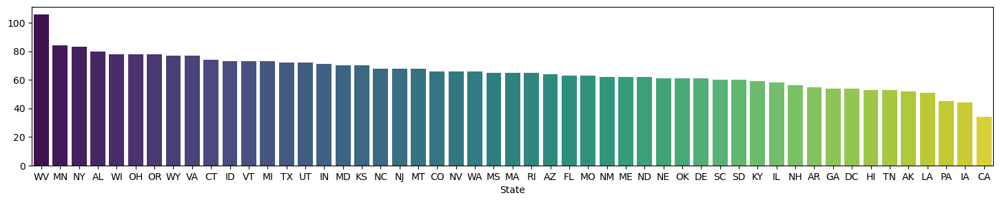

In [11]:
x=df['State'].value_counts().sort_values(ascending=False).index
y=df['State'].value_counts().sort_values(ascending=False).values
plt.figure(figsize=(18,3))
sns.barplot(x=x,y=y,palette='viridis')
plt.show()


WV has the highest number of customers while CA has the least no.of customers

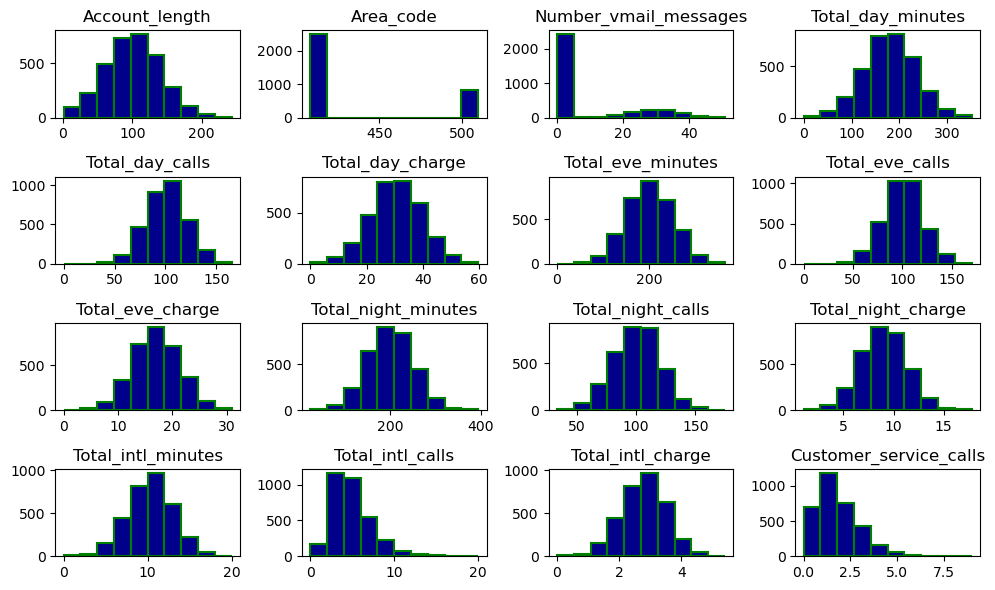

In [12]:
#viewing the data distribution 
df.hist(figsize=(10, 6),color='darkblue', edgecolor='green', linewidth=1.5, grid=False)
plt.tight_layout()
plt.show()

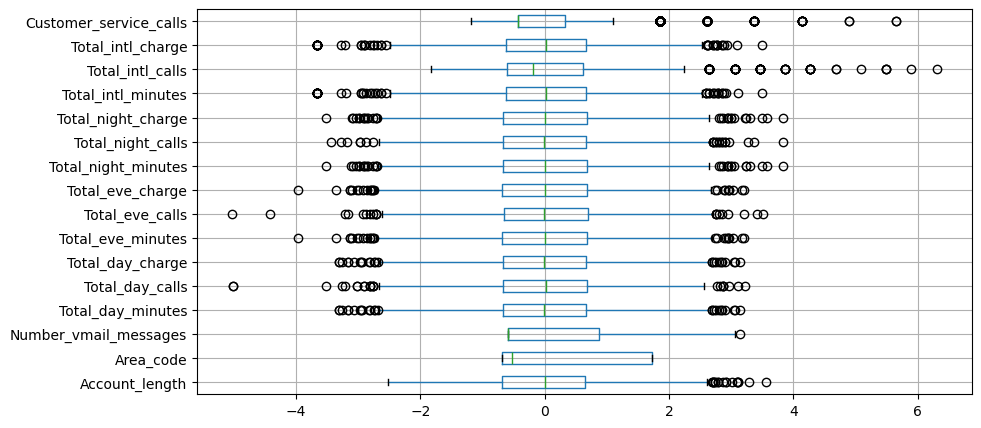

In [13]:
# viewing the numerical columns through box plots to check for outliers
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
df_normalized = pd.DataFrame(scaler.fit_transform(df.select_dtypes(['int','float'])), columns=df.select_dtypes(['int','float']).columns)
df_normalized.boxplot(vert=False,figsize=(10, 5));

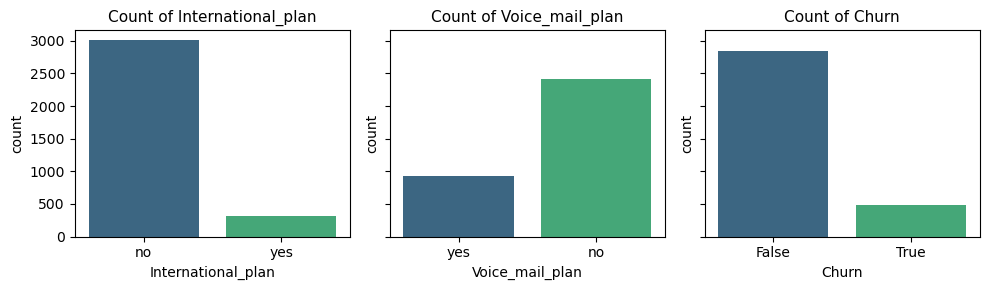

In [14]:
# Create countplot
cat_and_bool_columns=df.select_dtypes(['object','bool']).iloc[:,2:].columns
cat_and_bool_columns
fig,axes = plt.subplots(ncols=len(cat_and_bool_columns),figsize=(10, 3),sharey=True)  # Adjust figure size as needed
# sns.countplot(data=df, x='International_plan',ax=axes[0])

for i, column in enumerate(cat_and_bool_columns):
    sns.countplot(data=df, x=column, ax=axes[i],palette='viridis')
    axes[i].set_title(f'Count of {column}',fontsize=11)
plt.tight_layout()    
plt.show()

# column

Outliers were noted in a number of columns amongst them customer_services_call,Total_intl_calls,Total_eve_calls and Total_day_calls

##### Bivarient analysis

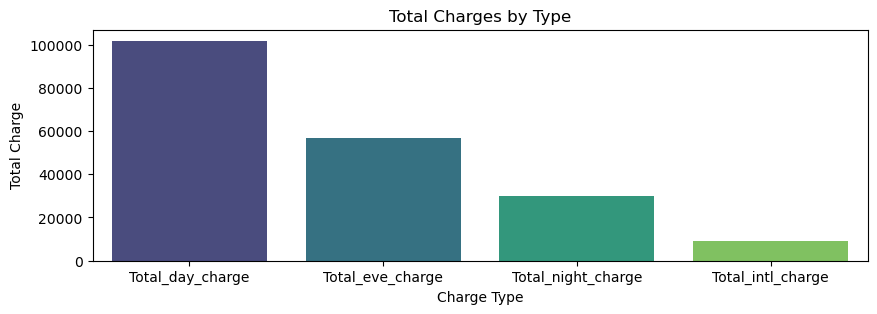

In [15]:
# viewing the Total charge by Total charge type
plt.figure(figsize=(10,3))
x=df[['Total_day_charge','Total_eve_charge','Total_night_charge','Total_intl_charge']].sum().index
y=df[['Total_day_charge','Total_eve_charge','Total_night_charge','Total_intl_charge']].sum().values

sum_df = pd.DataFrame({'Charge Type': x, 'Total Charge': y})

# Create bar plot
sns.barplot(x='Charge Type', y='Total Charge', data=sum_df,palette='viridis')

# Add labels and title
plt.xlabel('Charge Type')
plt.ylabel('Total Charge')
plt.title('Total Charges by Type')

# Show plot
plt.show()

<Axes: xlabel='Customer_service_calls', ylabel='Count'>

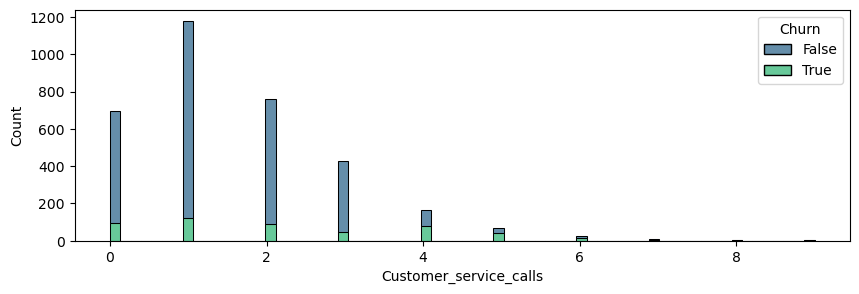

In [16]:
# distribution of customer service calls and churning
plt.figure(figsize=(10,3))
sns.histplot(df, x='Customer_service_calls', hue='Churn', multiple='stack',palette='viridis')

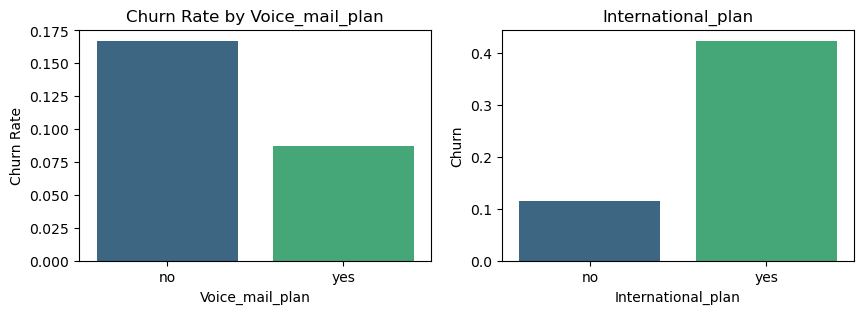

In [17]:
# Churn rate by Voice_mail_plan and International_plan
columns=['Voice_mail_plan','International_plan','Customer_service_calls']
churn_by_voice_mail_plan = df.groupby('Voice_mail_plan')['Churn'].mean().reset_index()
fig,axes=plt.subplots(ncols=2,figsize=(10, 3),sharey=False)
sns.barplot(x='Voice_mail_plan', y='Churn', data=df.groupby('Voice_mail_plan')['Churn'].mean().reset_index(), palette='viridis',ax=axes[0])
sns.barplot(x='International_plan', y='Churn', data=df.groupby('International_plan')['Churn'].mean().reset_index(), palette='viridis',ax=axes[1])

axes[0].set_title('Churn Rate by Voice_mail_plan')
axes[1].set_title('International_plan')
axes[0].set_ylabel('Churn Rate')
plt.show()

In [18]:
# Viewing the relationship of the int and flots column
plt.figure(figsize=(12,6))


<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

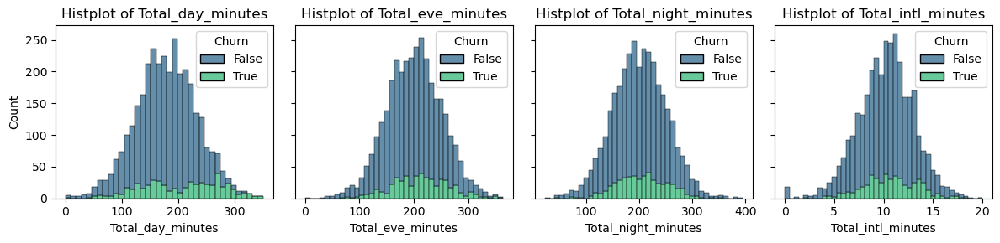

In [19]:
# scatter plots for various columns and the 
# Create histogram with hue
columns=['Total_day_minutes','Total_eve_minutes','Total_night_minutes','Total_intl_minutes']

fig,axes=plt.subplots(ncols=4,figsize=(12,3),sharey=True)
for i,col in enumerate(columns):
    sns.histplot(df, x=col, hue='Churn', multiple='stack',ax=axes[i],palette='viridis')
    axes[i].set_title('Histplot of '+col)
plt.tight_layout()    

All category for call minutes are all normally distrubuted.

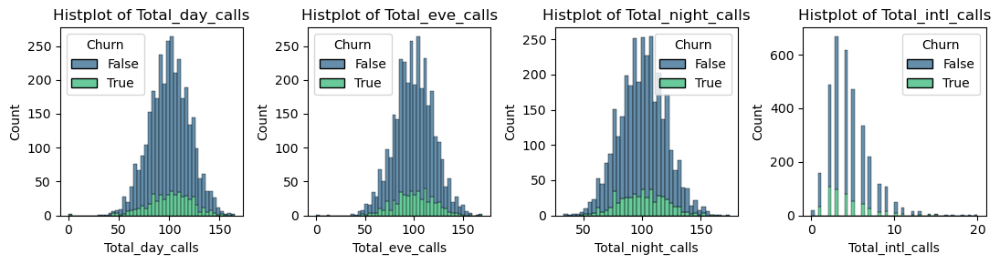

In [20]:
# Viewing the distribution of number of calls and churning
columns=['Total_day_calls','Total_eve_calls','Total_night_calls','Total_intl_calls']

fig,axes=plt.subplots(ncols=4,figsize=(11,3),sharey=False)
for i,col in enumerate(columns):
    sns.histplot(df, x=col, hue='Churn', multiple='stack',ax=axes[i],palette='viridis')
    axes[i].set_title('Histplot of '+col)
plt.tight_layout() 
plt.show()

Total day calls, total evening calls and total night calls are normally distributed since they have a bell shaped curve

Highest income is generated during the day and inernational calls have the lowest income

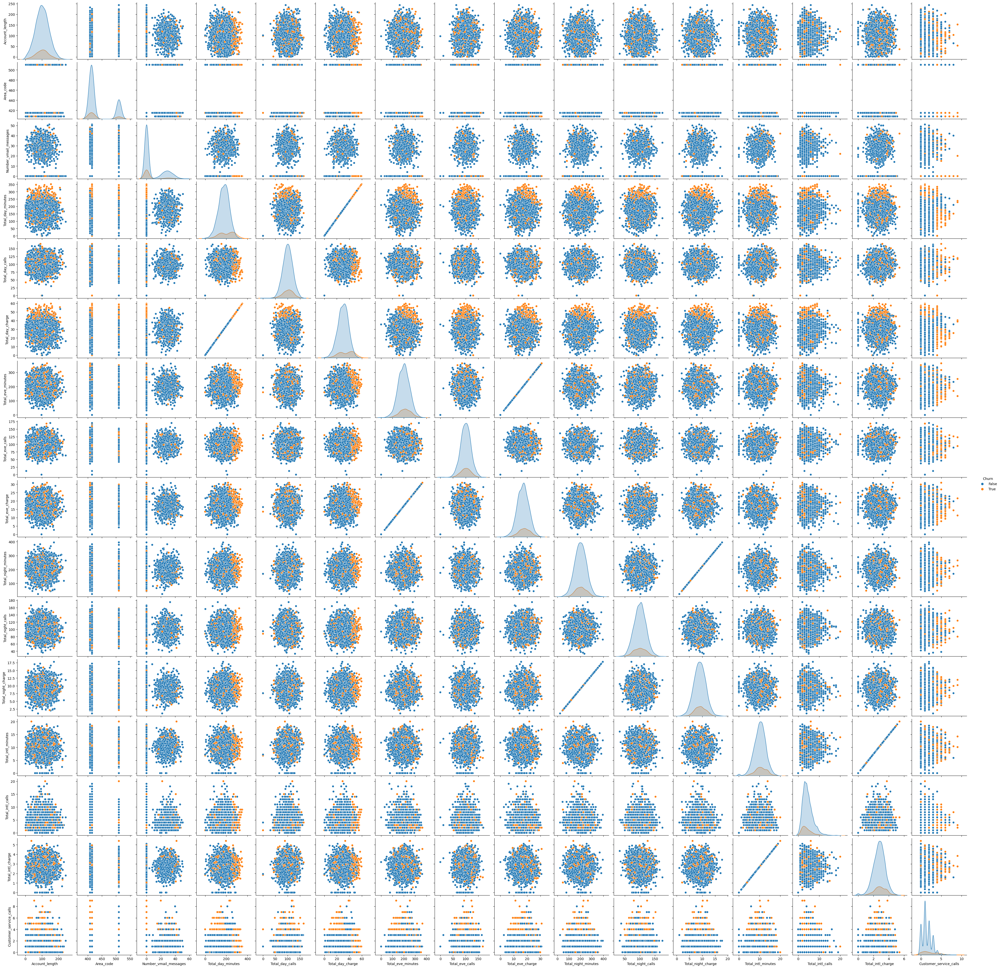

In [21]:
# Viewing the relationshipbetween diffent fields and churning
sns.pairplot(data=df,hue='Churn');

## 3. Data Preperation

In [22]:
# changing ['Voice_mail_plan','International_plan'] columns from object to bool
df=df.applymap(lambda x: True if x == 'yes' else (False if x == 'no' else x) )
df[['International_plan','Voice_mail_plan']].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 2 columns):
 #   Column              Non-Null Count  Dtype
---  ------              --------------  -----
 0   International_plan  3333 non-null   bool 
 1   Voice_mail_plan     3333 non-null   bool 
dtypes: bool(2)
memory usage: 6.6 KB


In [23]:
# view the correlation between various fields and churning
con_columns=df.select_dtypes(['int','float','bool']).columns
corr=df[con_columns].corr()['Churn']
corr

Account_length            0.016541
Area_code                 0.006174
International_plan        0.259852
Voice_mail_plan          -0.102148
Number_vmail_messages    -0.089728
Total_day_minutes         0.205151
Total_day_calls           0.018459
Total_day_charge          0.205151
Total_eve_minutes         0.092796
Total_eve_calls           0.009233
Total_eve_charge          0.092786
Total_night_minutes       0.035493
Total_night_calls         0.006141
Total_night_charge        0.035496
Total_intl_minutes        0.068239
Total_intl_calls         -0.052844
Total_intl_charge         0.068259
Customer_service_calls    0.208750
Churn                     1.000000
Name: Churn, dtype: float64

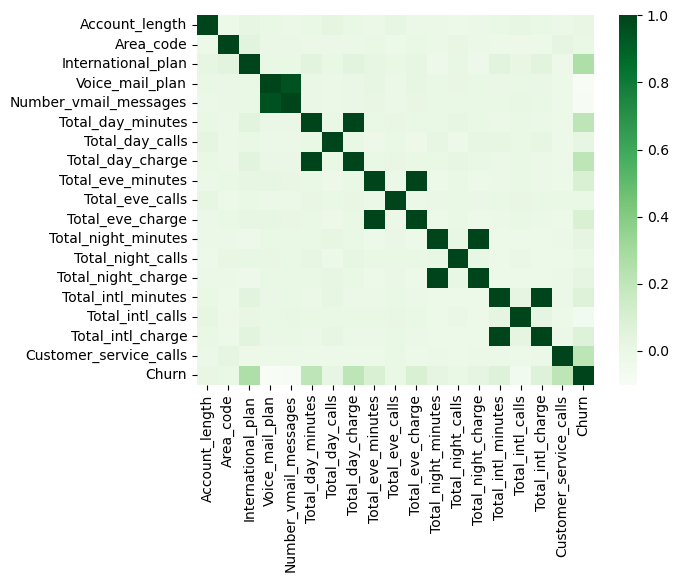

In [24]:
# Viewing correlation between numeric columns and churn column
sns.heatmap(df[con_columns].corr(), cmap='Greens');

In [25]:
# selecting columns that have a high correlation to churning
columns=['International_plan','Total_day_minutes','Total_eve_minutes','Total_night_minutes','Total_intl_minutes','Customer_service_calls','Churn']
df=df[columns]
df.head()

,International_plan,Total_day_minutes,Total_eve_minutes,Total_night_minutes,Total_intl_minutes,Customer_service_calls,Churn
0,False,265.1,197.4,244.7,10.0,1,False
1,False,161.6,195.5,254.4,13.7,1,False
2,False,243.4,121.2,162.6,12.2,0,False
3,True,299.4,61.9,196.9,6.6,2,False
4,True,166.7,148.3,186.9,10.1,3,False


## 4. Modeling

In [26]:
from sklearn.model_selection import train_test_split,cross_val_score, KFold, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score,recall_score,precision_score ,f1_score,confusion_matrix, classification_report, ConfusionMatrixDisplay, make_scorer 
from sklearn.metrics import classification_report
from imblearn.over_sampling import SMOTE

In [27]:
# selecting X and y
y=df['Churn']
X=df.drop(columns='Churn',axis=1)

In [28]:
# spliting the data into Train and test
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.25,random_state=42,stratify=y)

print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(2499, 6) (834, 6) (2499,) (834,)


In [29]:
# Standardiszing the training and test data
X_train_scaled=pd.DataFrame(scaler.fit_transform(X_train.select_dtypes(['int','float'])),columns=X_train.select_dtypes(['int','float']).columns,index=X_train.index)
X_test_scaled=pd.DataFrame(scaler.fit_transform(X_test.select_dtypes(['int','float'])),columns=X_test.select_dtypes(['int','float']).columns,index=X_test.index)


In [30]:
# selecting the bool column from the training and test data
X_train_bool=X_train.select_dtypes('bool')
X_test_bool=X_test.select_dtypes('bool')


In [31]:
# concatinating the two data frames
X_train_scaled = pd.concat([X_train_scaled, X_train_bool], axis=1)
X_test_scaled = pd.concat([X_test_scaled, X_test_bool], axis=1)
X_train_scaled.head()


,Total_day_minutes,Total_eve_minutes,Total_night_minutes,Total_intl_minutes,Customer_service_calls,International_plan
556,-0.372962,2.020613,0.528564,0.619251,-1.202844,False
2596,-1.064668,-1.237400,0.474135,-1.575545,-0.432691,False
944,-0.218020,-0.205860,-0.154825,-0.371947,1.877769,False
1152,0.549313,-0.558237,-2.148546,-0.513547,-0.432691,False
3060,0.597271,-0.231451,3.054482,-0.655147,1.107615,False


In [32]:
model=LogisticRegression(random_state=42)
model.fit(X_train_scaled,y_train)

LogisticRegression(random_state=42)

In [33]:
y_pred=model.predict(X_test_scaled)

conf_matrix = confusion_matrix(y_test, y_pred)
conf_matrix

array([[691,  22],
       [ 99,  22]], dtype=int64)

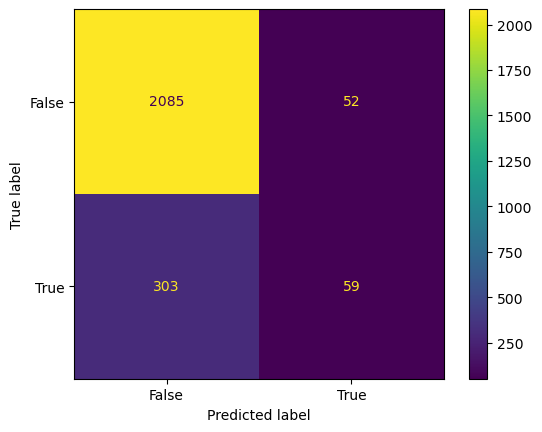

In [34]:
# Plot confusion matrix
ConfusionMatrixDisplay.from_estimator(estimator=model,X=X_train_scaled,y=y_train,cmap='viridis');

#### Model Evaluation

In [35]:
# Performing model evaluation through Kfold cross validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Perform cross-validation
cv_results = cross_val_score(model, X_train_scaled, y_train, cv=kf, scoring='accuracy')

print(f"Cross-validation accuracies: {cv_results}")
print(f"Mean cross-validation accuracy: {cv_results.mean()}")

Cross-validation accuracies: [0.848      0.886      0.826      0.862      0.85571142]
Mean cross-validation accuracy: 0.8555422845691384


In [36]:
model_accuracy = cross_val_score (model,X_test_scaled, y_test, cv=3, scoring='accuracy').mean()
model_recall = cross_val_score (model,X_test_scaled, y_test,cv=3,scoring=make_scorer (recall_score)).mean()
model_precision = cross_val_score (model,X_test_scaled, y_test,cv=3,scoring=make_scorer (precision_score)).mean()
model_f1 = cross_val_score (model,X_test_scaled, y_test,cv=3,scoring=make_scorer (f1_score)).mean ()

print(f"""Logistic_Regression Scores
***************************
Accuracy: {model_accuracy:1.3f}
Recall: {model_recall:1.3f}
Precision: {model_precision:1.3f}
F1 Score: {model_f1:1.3f}
""")

Logistic_Regression Scores
***************************
Accuracy: 0.853
Recall: 0.140
Precision: 0.476
F1 Score: 0.214



##### Interpretation
85.5% of the instances were classified correctly.

15.7% of the actual positive instances were correctly classified as positive

51% of the instances classified as positive by the model were actually positive.



In [37]:
## building different models
def model_building(model_name):

    np.random.seed(42)
    
    model = model_name
    model.fit(X_train_scaled, y_train)
    print(f"{model_name}\n***************************************")
    
    model_accuracy = cross_val_score (model,X_test_scaled, y_test, cv=3, scoring='accuracy').mean()
    model_recall = cross_val_score (model,X_test_scaled, y_test,cv=3,scoring=make_scorer (recall_score)).mean()
    model_precision = cross_val_score (model,X_test_scaled, y_test,cv=3,scoring=make_scorer (precision_score)).mean()
    model_f1 = cross_val_score (model,X_test_scaled, y_test,cv=3,scoring=make_scorer (f1_score)).mean ()
    print(f"""
    Accuracy: {model_accuracy:1.3f}
    Recall: {model_recall:1.3f}
    Precision: {model_precision:1.3f}
    F1 Score: {model_f1:1.3f}
    """)
## dictionary with different models
model_dict = {'lr':LogisticRegression(random_state=42), 
              'dt':DecisionTreeClassifier(random_state=42),
              'knn':KNeighborsClassifier(),
              'rf': RandomForestClassifier(random_state=42)}
              
## calling to build and evaluate models
for key in model_dict.keys():
    model_building(model_dict[key])
    
    

LogisticRegression(random_state=42)
***************************************

    Accuracy: 0.853
    Recall: 0.140
    Precision: 0.476
    F1 Score: 0.214
    
DecisionTreeClassifier(random_state=42)
***************************************

    Accuracy: 0.857
    Recall: 0.496
    Precision: 0.509
    F1 Score: 0.502
    
KNeighborsClassifier()
***************************************

    Accuracy: 0.891
    Recall: 0.331
    Precision: 0.824
    F1 Score: 0.467
    
RandomForestClassifier(random_state=42)
***************************************

    Accuracy: 0.900
    Recall: 0.479
    Precision: 0.764
    F1 Score: 0.581
    


## 5. Evaluation:

##### Model Selection

The Random Forest classifier achieved the highest accuracy among the four models. It also has the high precision, indicating a low false positive rate, and a relatively higher recall compared to the other models, suggesting better performance in identifying positive cases. The F1 score is also the highest, indicating a good balance between precision and recall.

90.0% of the instances were classified correctly.

47.9% of the actual positive instances were correctly classified as positive

76.4% of the instances classified as positive by the model were actually positive.

An F1 score of 58.1% indicates the model has moderate performance in balancing precision and recall.


##### Analysis

Based on the available data, the key predictors of customer churn rate are:


A higher number of customer service calls may indicate dissatisfaction or issues with the service, which could lead to churn..

Customers with international plans may have different usage patterns or needs compared to those without such plans, affecting their likelihood of chuls.

High usage of daytime minutes may indicate active engagement with the service, potentially reducing the likelihoodalls.

Similar to daytime minutes, high usage of evening minutes might signify engagement with the service, potentcingy  calls.

Nighttime usage patterns can also provide insights into customer behavior anal calls.

International calling behavior can be a significant factor in predicting churn, especially for customersnational call planead to churn.

##### Conclusion and recommedation

These predictors provide valuable insights into customer behavior, usage patterns, and potential pain points that may contribute to churn. Zencom should take proactive measures to retain customers, such as targeted marketing campaigns, personalized offers, or improving customer service experiences.